**Description:** A prototype dashboard for identifying table columns from with issues.  This version focuses on ComCom data, but should be useful for LSSTcam commissioning data processing as well.

See Jira issue <a href=https://rubinobs.atlassian.net/browse/SP-861>SP-861</a>.



In [1]:

## 1.1 User-defined values

instrument = 'LSSTCam'
collectionName = 'LSSTCam/runs/DRP/20250501_20250609/w_2025_26/DM-51580'
table_type = 'objectTable' # currently, just 'objectTable' is recognized.  'sourceTable' is in the process of being implemented.

# Use downloaded CSV files ("True") or query the EFD ("False"):
useCSV = True

if useCSV:
    if instrument == 'LSSTComCam':
        objectSummaryDir = '../../pipe_tasks/LSSTComCam'
    elif instrument == 'LSSTCam':
        objectSummaryDir = '../../pipe_tasks/LSSTCam'
else:
    efd_name = 'usdfdev_efd'
    db_name = 'lsst.dm'
    table_name = """lsst.dm.%s""" % (table_type)
    time_lo = '2025-04-08'
    time_hi = '2025-12-31'
    
# Verbosity level:  0, 1, 2, 3...  higher values yield more output to screen
verbose = 2

In [2]:

## 1.2 Import packages

# Generic python packages
import os
import glob
import pickle
import numpy as np
import pandas as pd
import warnings
import logging
import matplotlib.pyplot as plt
import seaborn as sns
import re # Import the regular expression module
from IPython.display import display

# Astropy-related packages
from astropy.time import Time

# LSST packages
from lsst_efd_client import EfdClient
import lsst.daf.butler as dafButler
from lsst.resources import ResourcePath

# Converts matplotlib.category INFO messages to WARNINGS
mpl_logger = logging.getLogger('matplotlib')
mpl_logger.setLevel(logging.WARNING)

# Set filter warnings to "ignore" to avoid a lot of "logorrhea" to the screen:
warnings.filterwarnings("ignore")

# Set pandas to show all rows...
pd.set_option("display.max_rows", None)

In [3]:

# 1.3. Define methods and classes...

# Define a class to stop "Run All" at a code cell containing the command "raise StopExecution":
class StopExecution(Exception):
    def _render_traceback_(self):
        pass



def create_tract_markup_color_dict(repo, collection, skymap_name, top_n=20, plot=False):
    """
    Query LSSTCam science exposures, determine tract IDs, and return:
      - tract_dict_top: dict mapping tractId -> most frequent target_name (restricted to top targets)
      - marker_dict_top: dict mapping target_name -> matplotlib marker symbol
      - color_dict_top: dict mapping target_name -> matplotlib color

    Optionally plots the sky distribution of the top targets using Astropy for coordinate handling.

    Parameters
    ----------
    repo : str
        Butler repository path (e.g., '/repo/main')
    collection : str
        Butler collection name (e.g., 'LSSTCam/defaults')
    skymap_name : str
        Name of the skymap to load (e.g., 'lsst_cells_v1')
    top_n : int, optional
        Number of top target_names to consider (default=20)
    plot : bool, optional
        If True, produce a matplotlib Aitoff sky plot

    Returns
    -------
    tract_dict_top : dict
    marker_dict_top : dict
    color_dict_top : dict
    """

    # --- Step 0: Important necessary packages ---
    import matplotlib.pyplot as plt
    import numpy as np
    from astropy.coordinates import SkyCoord
    import astropy.units as u
    from lsst.rsp import get_tap_service
    import lsst.daf.butler as dafButler
    from lsst.geom import SpherePoint, degrees

    # --- Step 1: Query ConsDB ---
    cdb = get_tap_service("consdbtap")
    assert cdb is not None, "Could not connect to consdbtap service."

    query = """SELECT img_type, science_program, target_name, scheduler_note, 
                      s_ra, s_dec, band, exp_midpt, exp_midpt_mjd, exp_time, can_see_sky 
               FROM cdb_lsstcam.visit1 
               WHERE img_type='science' AND can_see_sky='True'"""
    results = cdb.search(query).to_table()
    df_sci_exp = results.to_pandas()

    # Normalize empty target_name values
    df_sci_exp['target_name'] = (
        df_sci_exp['target_name']
        .replace('', np.nan)
        .fillna('<blank>')
    )

    # --- Step 2: Load skymap ---
    butler = dafButler.Butler(repo, collections=collection)
    skyMap = butler.get('skyMap', skymap=skymap_name)

    # --- Step 3: Add tractId ---
    def get_tract_id(row):
        try:
            coord = SpherePoint(row['s_ra'], row['s_dec'], degrees)
            tractInfo = skyMap.findTract(coord)
            return tractInfo.getId()
        except Exception:
            return None

    df_sci_exp['tractId'] = df_sci_exp.apply(get_tract_id, axis=1)

    # --- Step 4: Top N targets ---
    top_targets = (
        df_sci_exp['target_name']
        .value_counts()
        .head(top_n)
        .index
        .tolist()
    )

    df_sci_exp_top = df_sci_exp[df_sci_exp['target_name'].isin(top_targets)]

    # --- Step 5: tract_dict_top ---
    counts = df_sci_exp_top.groupby(['tractId', 'target_name']).size().reset_index(name='count')
    tract_dict_top = (
        counts.sort_values(['tractId', 'count'], ascending=[True, False])
              .drop_duplicates(subset='tractId')
              .set_index('tractId')['target_name']
              .to_dict()
    )

    # --- Step 6: Count unique tracts per target_name ---
    tract_counts = (
        df_sci_exp.groupby('target_name')['tractId']
        .nunique()
        .to_dict()
    )

    # --- Step 7: Sort top targets by tract count ---
    legend_order = sorted(top_targets, key=lambda t: tract_counts.get(t, 0), reverse=True)

    # --- Step 8: Assign markers/colors in sorted order ---
    marker_styles = ['o', 's', '^', 'v', '<', '>', 'D', 'p', '*', 'h', 'H', 'X', 'd', '|', '_', '+', 'x', 'P', '1', '2']
    color_cycle = plt.cm.tab20.colors

    marker_dict_top = {t: marker_styles[i % len(marker_styles)] for i, t in enumerate(legend_order)}
    color_dict_top = {t: color_cycle[i % len(color_cycle)] for i, t in enumerate(legend_order)}

    # Add "Other" category
    marker_dict_top["Other"] = '.'
    color_dict_top["Other"] = 'lightgray'

    # --- Step 9: Optional plotting ---
    if plot:
        fig = plt.figure(figsize=(10, 5))
        ax = fig.add_subplot(111, projection="aitoff")
        ax.grid(True)

        # Plot top targets in sorted order
        for target in legend_order:
            subset = df_sci_exp[df_sci_exp['target_name'] == target]
            coords = SkyCoord(ra=subset['s_ra'].values * u.deg,
                              dec=subset['s_dec'].values * u.deg,
                              frame='icrs')
            # Wrap RA and flip for Rubin convention
            ra_rad = -coords.ra.wrap_at(180 * u.deg).radian
            dec_rad = coords.dec.radian

            ax.scatter(
                ra_rad,
                dec_rad,
                marker=marker_dict_top[target],
                color=color_dict_top[target],
                label=f"{target} ({tract_counts.get(target, 0)} tracts)",
                alpha=0.7,
                s=20
            )

        # Plot "Other" targets last
        subset_other = df_sci_exp[~df_sci_exp['target_name'].isin(top_targets)]
        if not subset_other.empty:
            coords = SkyCoord(ra=subset_other['s_ra'].values * u.deg,
                              dec=subset_other['s_dec'].values * u.deg,
                              frame='icrs')
            ra_rad = -coords.ra.wrap_at(180 * u.deg).radian
            dec_rad = coords.dec.radian

            other_tracts = subset_other['tractId'].nunique()

            ax.scatter(
                ra_rad,
                dec_rad,
                marker=marker_dict_top["Other"],
                color=color_dict_top["Other"],
                label=f"Other ({other_tracts} tracts)",
                alpha=0.5,
                s=10
            )

        ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=4, fontsize='small')
        ax.set_title(f"Top {top_n} LSSTCam Science Fields in ConsDB by Tract", pad=20)
        plt.show()

    return tract_dict_top, marker_dict_top, color_dict_top


def instrument_create_tract_markup_color_dict(instrument):

    if instrument == 'LSSTComCam':
        
        # From Slide 9 of https://docs.google.com/presentation/d/1NGzrT4t6wDGQ2-2a8rjioToquhx2vOP_KJTrPiCrDDY/edit#slide=id.g33de3f5c849_6_250
        tract_dict={453: '47 Tuc', 
                    454: '47 Tuc',
                   4849: 'ECDFS', 
                   5063: 'ECDFS',
                   4848: 'ECDFS', 
                   2394: 'EDFS', 
                   2234: 'EDFS',
                   4016: 'Fornax', 
                   4017: 'Fornax', 
                   4218: 'Fornax', 
                   4217: 'Fornax', 
                   5525: 'Rubin_SV_095-25', 
                   5526: 'Rubin_SV_095-25', 
                   7611: 'Seagull', 
                   7610: 'Seagull', 
                   7850: 'Seagull',
                   10463: 'Rubin_SV_38_7', 
                   10464: 'Rubin_SV_38_7', 
                   10704: 'Rubin_SV_38_7'
                   }

        marker_dict={'47 Tuc': 'o', 
                     'ECDFS': 'v', 
                     'EDFS': '^', 
                     'Fornax': 's', 
                     'Rubin_SV_095-25': '*', 
                     'Seagull': 'd', 
                     'Rubin_SV_38_7': 'P', 
                     'Other': 'X'
                    }

        color_dict= {'47 Tuc': 'b', 
                     'ECDFS': 'g', 
                     'EDFS': 'r', 
                     'Fornax': 'c', 
                     'Rubin_SV_095-25': 'm', 
                     'Seagull': 'y', 
                     'Rubin_SV_38_7': 'k', 
                     'Other': 'gray'
                    }

    elif instrument == 'LSSTCam':
    
        try:

            # Try to grab from the ConsDB

            tract_dict, marker_dict, color_dict = create_tract_markup_color_dict(
                repo='/repo/main',
                collection='LSSTCam/defaults',
                skymap_name='lsst_cells_v1',
                top_n=20,
                plot=True   # Set to False if you just want the dictionaries
            )

        except:
        
            # If not, here is an outdated list the Times Square TargetViewer
   
            tract_dict={9813 : 'COSMOS', 
                        1291 : 'Carina',
                        1292 : 'Carina',
                        1293 : 'Carina',
                        1417 : 'Carina',
                        9591 : 'DESI_SV3_R1',
                        9348 : 'DESI_SV3_R1',
                        10804 : 'M49',
                        10321 : 'M49',
                        10563 : 'M49',
                        10562 : 'M49',
                        10320 : 'M49',
                        10803 : 'M49',
                        6325: 'New_Horizons', 
                        6324: 'New_Horizons', 
                        6096: 'New_Horizons', 
                        6323: 'New_Horizons', 
                        6555: 'New_Horizons', 
                        6554: 'New_Horizons', 
                        3361: 'Prawn',
                        3360: 'Prawn',
                        3359: 'Prawn',
                        3362: 'Prawn',
                        3176: 'Prawn',
                        3175: 'Prawn',
                        8401:  'Rubin_SV_212_-7',
                        8400:  'Rubin_SV_212_-7',
                        8399:  'Rubin_SV_212_-7',
                        8641:  'Rubin_SV_212_-7',
                        8158:  'Rubin_SV_212_-7',
                        8883:  'Rubin_SV_212_-7',
                        6740:  'Rubin_SV_216_-17',
                        6973:  'Rubin_SV_216_-17',
                        3533:  'Rubin_SV_225_-40',
                        3534:  'Rubin_SV_225_-40',
                        3725:  'Rubin_SV_225_-40',
                        3346:  'Rubin_SV_225_-40',
                        3724:  'Rubin_SV_225_-40',
                        3345:  'Rubin_SV_225_-40',
                        3532:  'Rubin_SV_225_-40',
                        5857:  'Trifid-Lagoon',
                        5636:  'Trifid-Lagoon',
                        5635:  'Trifid-Lagoon',
                        5634:  'Trifid-Lagoon',
                        5858:  'Trifid-Lagoon',
                        1189:  'Alpha_Centauri',
                        1312:  'Alpha_Centauri',
                        1438:  'Alpha_Centauri',
                        1439:  'Alpha_Centauri_at_the_edge'
                       }

            marker_dict={'COSMOS': 'o', 
                         'Carina': 'v', 
                         'DESI_SV3_R1': '^', 
                         'M49': 's', 
                         'New_Horizons': '*', 
                         'Prawn': 'd', 
                         'Rubin_SV_212_-7': 'P',
                         'Rubin_SV_216_-17': '<', 
                         'Rubin_SV_225_-40': '>', 
                         'Trifid-Lagoon': '8', 
                         'Alpha_Centauri': 'h', 
                         'Alpha_Centauri_at_the_edge': 'H', 
                         'Other': 'X'
                        }

            color_dict= {'COSMOS': 'b', 
                         'Carina': 'g', 
                         'DESI_SV3_R1': 'r', 
                         'M49': 'c', 
                         'New_Horizons': 'm', 
                         'Prawn': 'pink', 
                         'Rubin_SV_212_-7': 'k', 
                         'Rubin_SV_216_-17': 'c', 
                         'Rubin_SV_225_-40': 'aquamarine', 
                         'Trifid-Lagoon': 'powderblue', 
                         'Alpha_Centauri': 'violet', 
                         'Alpha_Centauri_at_the_edge': 'darkviolet',              
                         'Other': 'gray'
                        }

        return tract_dict, marker_dict, color_dict
            

In [4]:

# 2. Retrieve data

In [5]:

## 2.1. Retrieve data from CSV files

In [6]:

### 2.1.1.  Identify CSV files to read

if useCSV:
    
    if table_type == 'objectTable':
        pattern = os.path.join(objectSummaryDir, 'objectSummary.*.csv')
    elif table_type == 'sourceTable':
        pattern = os.path.join(objectSummaryDir, 'sourceSummary.*.csv')
    else:
        print("""%s is unrecognized...  Stopping here!""" % (table_type))
        raise StopExecution

    files = glob.glob(pattern)

    if verbose > 2:
        for f in files:
            print(f)


In [7]:

### 2.1.2.  Create pandas DataFrame that contains the data from all the CSV files

# Per Gemini+2.5-Flash:

if useCSV:
    
    # Create an empty list to store individual DataFrames
    all_dfs = []

    # Regular expression to find the tract or visit number
    # It looks for one or more digits (\d+) between "*Summary." and ".csv"
    if table_type == 'objectTable':
        tract_regex = re.compile(r'objectSummary\.(\d+)\.csv')
    elif table_type == 'sourceTable':
        visit_regex = re.compile(r'sourceSummary\.(\d+)\.csv')
    else:
        print("""%s is unrecognized...  Stopping here!""" % (table_type))
        raise StopExecution

    for file_path in files:
        try:
            # Read each CSV file into a DataFrame
            df_temp = pd.read_csv(file_path)

            # Extract the filename from the full path
            filename = os.path.basename(file_path)

            if table_type == 'objectTable':
                # Use regex to find the tract number
                match = tract_regex.match(filename)
                if match:
                    tract_number = int(match.group(1)) # Convert the extracted string to an integer
                    # Add the tract number as a new column to the temporary DataFrame
                    df_temp['tract'] = tract_number
                else:
                    print(f"Warning: Could not extract tract number from {filename}. 'tract' column for this file will be NaN.")
                    df_temp['tract'] = pd.NA # Assign a missing value if no tract is found
            elif table_type == 'sourceTable':
                # Use regex to find the tract number
                match = tract_regex.match(filename)
                if match:
                    visit_number = int(match.group(1)) # Convert the extracted string to an integer
                    # Add the tract number as a new column to the temporary DataFrame
                    df_temp['visit'] = visit_number
                else:
                    print(f"Warning: Could not extract visit number from {filename}. 'visit' column for this file will be NaN.")
                    df_temp['visit'] = pd.NA # Assign a missing value if no tract is found

            all_dfs.append(df_temp)

        except pd.errors.EmptyDataError:
            print(f"Warning: {file_path} is empty and will be skipped.")
        except Exception as e:
            print(f"Error reading {file_path}: {e}")

    # Concatenate all DataFrames in the list into a single DataFrame
    if all_dfs:
        df = pd.concat(all_dfs, ignore_index=True)
        if verbose > 1:
            print("Successfully loaded all CSV files into a single DataFrame.")
            print(f"Total rows in combined DataFrame: {len(df)}")
            #print(df['tract'].value_counts()) # Show the count of rows for each tract
    else:
        df = pd.DataFrame() # Create an empty DataFrame if no files were found or loaded
        if verbose > 0:
            print("No CSV files found or loaded to create a DataFrame.")


    # Check if 'Unnamed: 0' column exists and drop it
    if 'Unnamed: 0' in df.columns:
        df = df.drop(columns=['Unnamed: 0'])
        if verbose > 1:
            print("Removed 'Unnamed: 0' column from the combined DataFrame.")

    if verbose > 1:
        display(df.head()) # Display the first few rows of the final DataFrame


Successfully loaded all CSV files into a single DataFrame.
Total rows in combined DataFrame: 119850
Removed 'Unnamed: 0' column from the combined DataFrame.


,percent_01,percent_50,percent_99,total_rows,nan_count,nan_fraction,colname,tract
0,1035.900,51795.000,102554.100,103591,0,0.000,index,6975
1,6975.000,6975.000,6975.000,103591,0,0.000,tract,6975
2,6.000,29.000,79.000,103591,0,0.000,patch,6975
3,217.696,217.902,218.308,103591,193,0.002,i_ra,6975
4,-16.357,-15.965,-15.229,103591,193,0.002,i_dec,6975


In [8]:
### 2.1.3.  Create df_piv using pivot_table

# Per Gemini+2.5-Flash:

if useCSV:

    # Define the columns that will become values in the new DataFrame
    value_cols = [
        'percent_01', 'percent_50', 'percent_99',
        'total_rows', 'nan_count', 'nan_fraction'
    ]

    # Use pivot_table to reshape the DataFrame
    if table_type == 'objectTable':
        df_piv = df.pivot_table(
            index='tract',          # The column that will become the new index (one row per tract)
            columns='colname',      # The column whose unique values will become new columns
            values=value_cols       # The columns whose values will populate the new pivoted columns
        )
    elif table_type == 'sourceTable':
        df_piv = df.pivot_table(
            index='visit',          # The column that will become the new index (one row per tract)
            columns='colname',      # The column whose unique values will become new columns
            values=value_cols       # The columns whose values will populate the new pivoted columns
        )
    else:
        print("""%s is unrecognized...  Stopping here!""" % (table_type))
        raise StopExecution

    # After pivoting, the columns will be a MultiIndex (e.g., ('percent_01', 'ra')).
    # We need to flatten them to the desired format: <colname>_<metric>
    # The order is (metric, colname), so we need to swap levels and then join.

    # Swap the levels of the MultiIndex columns so 'colname' comes first
    df_piv.columns = df_piv.columns.swaplevel(0, 1)

    # Sort the columns for better readability (optional, but good practice)
    df_piv = df_piv.sort_index(axis=1)

    # Flatten the MultiIndex columns to a single level as '<colname>_<metric>'
    # This creates a new list of column names like 'ra_percent_01', 'ra_percent_50', etc.
    df_piv.columns = ['_'.join(col).strip() for col in df_piv.columns.values]

    # Reset the index to turn 'tract' from an index back into a regular column (optional)
    df_piv = df_piv.reset_index()

    # Rename df_piv as res
    res = df_piv

    if verbose > 1:
        print("\n--- Pivoted DataFrame (res(=df_piv)) ---")
        display(res.head())
        #print("\nNew res.columns:", res.columns.tolist())
        


--- Pivoted DataFrame (res(=df_piv)) ---


,tract,coord_dec_nan_count,coord_dec_nan_fraction,coord_dec_percent_01,coord_dec_percent_50,coord_dec_percent_99,coord_dec_total_rows,coord_decErr_nan_count,coord_decErr_nan_fraction,coord_decErr_percent_01,...,z_sersicFluxErr_percent_01,z_sersicFluxErr_percent_50,z_sersicFluxErr_percent_99,z_sersicFluxErr_total_rows,z_sizeExtendedness_nan_count,z_sizeExtendedness_nan_fraction,z_sizeExtendedness_percent_01,z_sizeExtendedness_percent_50,z_sizeExtendedness_percent_99,z_sizeExtendedness_total_rows
0,2982,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0
1,2983,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0
2,2995,0.0,0.0,-43.637,-43.277,-43.143,38704.0,798.0,0.021,0.0,...,NaN,NaN,NaN,38704.0,38704.0,1.0,NaN,NaN,NaN,38704.0
3,2996,0.0,0.0,-43.659,-43.391,-43.146,52660.0,1376.0,0.026,0.0,...,NaN,NaN,NaN,52660.0,52660.0,1.0,NaN,NaN,NaN,52660.0
4,2997,0.0,0.0,-43.436,-43.267,-43.143,60113.0,3451.0,0.057,0.0,...,NaN,NaN,NaN,60113.0,60113.0,1.0,NaN,NaN,NaN,60113.0


In [9]:

## Retrieve data from EFD

In [10]:

### 2.2.1. Prepare query

if not useCSV:
    query = '''SELECT * FROM "%s" WHERE  time > '%s' and time < '%s' ''' % (table_name, time_lo, time_hi)
    if verbose > 1:
        print(query)


In [11]:

# 2.2.2 Connect to EFD database and run query

if not useCSV:

    efd_client = EfdClient(efd_name, db_name=db_name)
    res = await efd_client.influx_client.query(query)

    if verbose > 0:
        print('Number of entries returned: ', len(res)) 
        if table_type == 'objectTable':
            print('Unique tracts returned:  ', len(res['tract'].unique()))
        elif table_type == 'sourceTable':
            print('Unique visits returned:  ', len(res['visit'].unique()))
        else:
            print("""%s is unrecognized...  Stopping here!""" % (table_type))
            raise StopExecution
        print('')

    if verbose > 1:
        display(res.head())

In [12]:

## 3.1 Get a list of column names that contain numeric data
numeric_columns = res.select_dtypes(include='number').columns.tolist()

# Display the numeric column names
if verbose > 2:
    print(numeric_columns)

In [13]:

## 3.2 Get a list of numeric columns with the suffix "_nan_fraction"
nan_fraction_columns = [
    col for col in res.select_dtypes(include='number').columns if col.endswith('_nan_fraction')
]

if table_type == 'objectTable':
    # Append 'tract' to the front of the list
    nan_fraction_columns = ['tract'] + nan_fraction_columns
elif table_type == 'sourceTable':
    # Append 'visit' to the front of the list
    nan_fraction_columns = ['visit'] + nan_fraction_columns
else:
    print("""%s is unrecognized...  Stopping here!""" % (table_type))
    raise StopExecution

# Display the filtered column names
if verbose > 2:
    print(nan_fraction_columns)

In [14]:

## 3.3 Create a new DataFrame with the selected columns
res_nan_fraction = res[nan_fraction_columns]

# Display the new DataFrame
if verbose > 0:
    display(res_nan_fraction.head())

,tract,coord_dec_nan_fraction,coord_decErr_nan_fraction,coord_ra_nan_fraction,coord_raErr_nan_fraction,coord_ra_dec_Cov_nan_fraction,deblend_iterations_nan_fraction,deblend_logL_nan_fraction,deblend_nChild_nan_fraction,deblend_nPeaks_nan_fraction,...,z_psfModel_TwoGaussian_gauss2_rho_nan_fraction,z_psfModel_TwoGaussian_gauss2_sigma_x_nan_fraction,z_psfModel_TwoGaussian_gauss2_sigma_y_nan_fraction,z_psfModel_TwoGaussian_n_iter_nan_fraction,z_ra_nan_fraction,z_raErr_nan_fraction,z_ra_dec_Cov_nan_fraction,z_sersicFlux_nan_fraction,z_sersicFluxErr_nan_fraction,z_sizeExtendedness_nan_fraction
0,2982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2995,0.0,0.021,0.0,0.021,0.021,0.0,0.714,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
3,2996,0.0,0.026,0.0,0.026,0.026,0.0,0.804,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
4,2997,0.0,0.057,0.0,0.057,0.057,0.0,0.827,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0


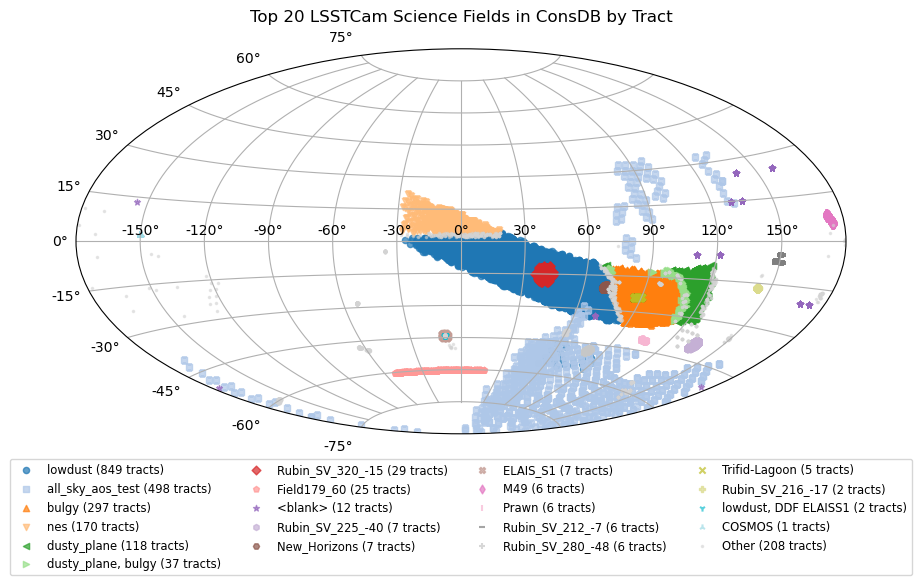

g


In [15]:

## 3.4 Plot histograms of the 'NaN fraction in a Tract (or Visit)' for all columns of res_nan_fraction that contain at least one tract (or visit) with a NaN fraction > 0.01 for that column

df = res_nan_fraction

# Grab relevant tract, marker, and color dictionaries appropriate for the instrument
tract_dict, marker_dict, color_dict = instrument_create_tract_markup_color_dict(instrument)

# Create the 'fieldname' column using map and fillna
if table_type == 'objectTable':
    df['fieldname'] = df['tract'].astype(int).map(tract_dict).fillna('Other')
else:
    df['fieldname'] = 'Other'

cols = df.columns.tolist()
cols.insert(1, cols.pop(cols.index('fieldname')))
df = df[cols]

#filternameList = ['u', 'g', 'r', 'i', 'z', 'y', 'none']
filternameList = ['g']

# Get numeric columns
df_numeric = df.select_dtypes(include='number')

# Filter for columns with values > 0.01
cols_above_threshold = df_numeric.columns[(df_numeric > 0.01).any()]

for filtername in filternameList:
    
    print(filtername)

    if filtername is 'none':
        numeric_cols = cols_above_threshold[~cols_above_threshold.str.match(r'^[ugrizy]_')]
    else:
        numeric_cols = cols_above_threshold[cols_above_threshold.str.match(f'^{filtername}_')]

    n_cols = len(numeric_cols)

    # Set global x-axis limits
    global_min = -0.1
    global_max = +1.1

    # Create figure with subplots stacked vertically
    fig, axes = plt.subplots(n_cols, 2, figsize=(12, 4*n_cols), sharex=False)

    # Adjust vertical spacing and title position
    plt.subplots_adjust(top=0.98, bottom=0.05, hspace=0.25, wspace=0.3)  # Increased hspace significantly

    # Create histograms
    for i, col in enumerate(numeric_cols):
        #ax = axes[i]
        ax_hist = axes[i, 0]
    
        # Calculate statistics
        data = df[col].dropna()
        data_desc = data.describe(percentiles=[0.01, 0.99])
        mean = data_desc['mean']
        std = data_desc['std']
        percent_01 = data_desc['1%']
        median = data_desc['50%']
        percent_99 = data_desc['99%']
        
        # Create histogram
        ax_hist.hist(data, bins=50, alpha=0.75, range=(global_min, global_max))
    
        # Add labels and stats
        parts = col.split("_")
        xlabel = col.replace("_nan_fraction", "")
        if table_type == 'objectTable':
            xlabel = f"NaN Fraction in tract:    {xlabel}"
        elif table_type == 'sourceTable':
            xlabel = f"NaN Fraction in visit:    {xlabel}"


        ax_hist.set_xlabel(xlabel)
        if table_type == 'objectTable':
            ax_hist.set_ylabel('N_tracts')
        elif table_type == 'sourceTable':
            ax_hist.set_ylabel('N_visits')

    
        # Add grid and statistics lines
        ax_hist.grid(True, alpha=0.3)
        ax_hist.axvline(mean, color='r', linestyle='--', alpha=0.8, 
                       label=f'Mean: {mean:.2f}')
        ax_hist.axvline(percent_01, color='b', linestyle='--', alpha=0.8, 
                       label=f'1%: {percent_01:.2f}')
        ax_hist.axvline(median, color='orange', linestyle='--', alpha=0.8, 
                       label=f'50% (Median): {median:.2f}')
        ax_hist.axvline(percent_99, color='g', linestyle='--', alpha=0.8, 
                       label=f'99%: {percent_99:.2f}')
    
        # Add stats text box
        stats_text = f'N: {len(data)}\n'
        stats_text += f'σ: {std:.2f}'
        ax_hist.text(0.10, 0.95, stats_text,
                    transform=ax_hist.transAxes,
                    verticalalignment='top',
                    horizontalalignment='right',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    

        ax_hist.legend()

        # Scatter plot of Tract (or Visit) vs. NaN Fraction
        ax_scatter = axes[i, 1]
   
        # Iterate through unique fieldnames
        for fieldname in df['fieldname'].unique():

            # Filter the DataFrame for the current fieldname
            subset = df[df['fieldname'] == fieldname]

            # Get the marker and color from the dictionaries
            marker = marker_dict[fieldname]
            color = color_dict[fieldname]

            # Scatter plot for the current fieldname
            if table_type == 'objectTable':
                ax_scatter.scatter(subset[col], subset['tract'],
                                   marker=marker, color=color,
                                   label=fieldname, alpha=0.7)  # Added label for legend
            elif table_type == 'sourceTable':
                ax_scatter.scatter(subset[col], subset['visit'],
                                   marker=marker, color=color,
                                   label=fieldname, alpha=0.7)  # Added label for legend

        if table_type == 'objectTable':
            xlabel = col.replace("_nan_fraction", "")
            xlabel = f"NaN Fraction in tract:    {xlabel}"
            ax_scatter.set_xlabel(xlabel)
            ax_scatter.set_ylabel('Tract')
            ax_scatter.grid(True, alpha=0.3)
            ax_scatter.legend(title='Fieldname', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        elif table_type == 'sourceTable':
            xlabel = col.replace("_nan_fraction", "")
            xlabel = f"NaN Fraction in visit:    {xlabel}"
            ax_scatter.set_xlabel(xlabel)
            ax_scatter.set_ylabel('Visit')
            ax_scatter.grid(True, alpha=0.3)
            ax_scatter.legend(title='Fieldname', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        

    # Set global x-axis limits
    plt.xlim(global_min, global_max)

    if table_type == 'objectTable':
        superTitle = """'NaN Fraction in Tract' for ObjectTable Columns \n (with at least one Tract with a NaN Fraction of at least 0.01) \n Collection: %s""" % (collectionName)
    elif table_type == 'sourceTable':
        superTitle = """'NaN Fraction in Visit' for SourceTable Columns \n (with at least one Visit with a NaN Fraction of at least 0.01) \n Collection: %s""" % (collectionName)
    else:
        superTitle = ''
    plt.suptitle(superTitle, y=1.001, size=14, weight='bold')
    plt.tight_layout()
    plt.show()
    #if table_type == 'objectTable':
        #outputPlotFile = """NaN_Fraction_in_Tract_histograms_%s.png""" % filtername
    #elif table_type == 'sourceTable':
        #outputPlotFile = """NaN_Fraction_in_Visit_histograms_%s.png""" % filtername
    #plt.savefig(outputPlotFile, dpi=150, bbox_inches='tight') 
    #plt.savefig(outputPlotFile)


In [16]:

## 3.5 Create a dataframe, summary_res_nan_fraction, that contains a summary description of res_nan_fraction

if table_type == 'objectTable':
    if 'tract' not in res_nan_fraction.columns:
        summary_res_nan_fraction = res_nan_fraction.describe(percentiles=[0.01, 0.99]).T
    else:
        summary_res_nan_fraction = res_nan_fraction.drop(columns=['tract']).describe(percentiles=[0.01, 0.99]).T
elif table_type == 'sourceTable':
    if 'visit' not in res_nan_fraction.columns:
        summary_res_nan_fraction = res_nan_fraction.describe(percentiles=[0.01, 0.99]).T
    else:
        summary_res_nan_fraction = res_nan_fraction.drop(columns=['visit']).describe(percentiles=[0.01, 0.99]).T

if verbose > 2:
    display(summary_res_nan_fraction)


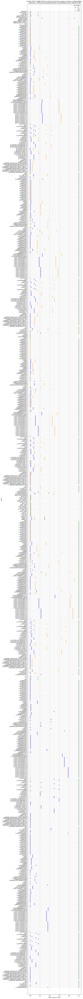

In [17]:

## 3.6 Plot the summary dataframe

df = summary_res_nan_fraction

# Get numeric columns
numeric_cols = df.columns
n_cols = len(numeric_cols)

plt.figure(figsize=(10, 15*n_cols))

plt.grid(True)

df['name'] = df.index
df['name'] = df['name'].str.replace('_nan_fraction', '', regex=False)
ax = sns.scatterplot(data=df , x="1%", y="name", color='b', label="1%")
sns.scatterplot(data=df , x="50%", y="name", ax=ax, color='orange', label="50%")
sns.scatterplot(data=df , x="99%", y="name", ax=ax, color='g', label="99%")

# Add legend
plt.legend(title="Percentiles")


# Change x-axis label
if table_type == 'objectTable':
    plt.xlabel("NaN Fraction in Tract")
elif table_type == 'sourceTable':
    plt.xlabel("NaN Fraction in Visit")

# Add title
if table_type == 'objectTable':
    plt.title("""Scatter Plot of 'NaN Fraction in Tract' for all the numeric columns in ObjectTable \n Collection: %s""" % (collectionName))
elif table_type == 'sourceTable':
    plt.title("""Scatter Plot of 'NaN Fraction in Visit' for all the numeric columns in ObjectTable \n Collection: %s""" % (collectionName))

# Adjust margins
plt.margins(y=0.0075)  # Reduce vertical margins

plt.tight_layout()

#if table_type == 'objectTable':
    #plt.savefig('NaN_Fraction_in_Tract_1percent_50percent_99percent.png') 
#elif table_type == 'sourceTable':
    #plt.savefig('NaN_Fraction_in_Visit_1percent_50percent_99percent.png') 


In [18]:

## 4.0 Clean up

#Reset pandas to its default maximum rows to print to screen
pd.reset_option("display.max_rows")

In [19]:
raise StopExecution()

## SandBox